<a href="https://colab.research.google.com/github/rajinipreethajohn/SP500/blob/main/Copy_of_Predictiong_stock_price_PyCaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stock market price predictions

Can we predict stock market price with classical econometrics models or machine learning models?

Documentation:

1. **PyCaret**: https://pycaret.readthedocs.io/en/latest/index.html PyCaret3.0
2. **sktime** : https://www.sktime.net/en/stable/api_reference/forecasting.html

# Installation

Follow the steps here: https://pycaret.gitbook.io/docs/get-started/installation


In [2]:
#only if you want to run it in Google Colab:
# for this chapter, we can install the light version of PyCaret as below.

#!pip install pycaret[full]

In [3]:
# if you got a warning that you need to "RESTART RUNTIME", go ahead and press that button.

# let's double ckeck the Pycaret version:
from pycaret.utils import version
version()

'3.1.0'

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Importing Stock Dataset

In [5]:
df = pd.read_csv("https://raw.githubusercontent.com/rajinipreethajohn/SP500/main/SP500.csv",parse_dates=['Date'],index_col=0)
df.head()

,Open,Close,Return Close day vs Close previous day
Date,,,
"Jul 27, 2023","4,598.26","4,537.41",-0.64%
"Jul 26, 2023","4,558.96","4,566.75",-0.02%
"Jul 25, 2023","4,555.19","4,567.46",0.28%
"Jul 24, 2023","4,543.39","4,554.64",0.40%
"Jul 21, 2023","4,550.16","4,536.34",0.03%


In [6]:
df = df.dropna()

In [7]:
# if you are working with Pandas, your first job should be changing the type of the index to datetime and then to period! This is a compatibility issue with other packages.
df.index

Index(['Jul 27, 2023', 'Jul 26, 2023', 'Jul 25, 2023', 'Jul 24, 2023',
       'Jul 21, 2023', 'Jul 20, 2023', 'Jul 19, 2023', 'Jul 18, 2023',
       'Jul 17, 2023', 'Jul 14, 2023',
       ...
       'Apr 12, 2013', 'Apr 11, 2013', 'Apr 10, 2013', 'Apr 09, 2013',
       'Apr 08, 2013', 'Apr 05, 2013', 'Apr 04, 2013', 'Apr 03, 2013',
       'Apr 02, 2013', 'Apr 01, 2013'],
      dtype='object', name='Date', length=2600)

In [8]:
df.index = pd.to_datetime(df.index).to_period('B')
df.index

PeriodIndex(['2023-07-27', '2023-07-26', '2023-07-25', '2023-07-24',
             '2023-07-21', '2023-07-20', '2023-07-19', '2023-07-18',
             '2023-07-17', '2023-07-14',
             ...
             '2013-04-12', '2013-04-11', '2013-04-10', '2013-04-09',
             '2013-04-08', '2013-04-05', '2013-04-04', '2013-04-03',
             '2013-04-02', '2013-04-01'],
            dtype='period[B]', name='Date', length=2600)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 2600 entries, 2023-07-27 to 2013-04-01
Freq: B
Data columns (total 3 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   Open                                    2600 non-null   object
 1   Close                                   2600 non-null   object
 2   Return Close day vs Close previous day  2600 non-null   object
dtypes: object(3)
memory usage: 81.2+ KB


In [10]:
df['Close'] = df['Close'].str.replace(',', '').astype(float)
df['Open'] = df['Open'].str.replace(',', '').astype(float)
df.rename(columns={'Return Close day vs Close previous day': 'Return'}, inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 2600 entries, 2023-07-27 to 2013-04-01
Freq: B
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    2600 non-null   float64
 1   Close   2600 non-null   float64
 2   Return  2600 non-null   object 
dtypes: float64(2), object(1)
memory usage: 81.2+ KB


In [12]:
df = df['Close']
df.head()

Date
2023-07-27    4537.41
2023-07-26    4566.75
2023-07-25    4567.46
2023-07-24    4554.64
2023-07-21    4536.34
Freq: B, Name: Close, dtype: float64

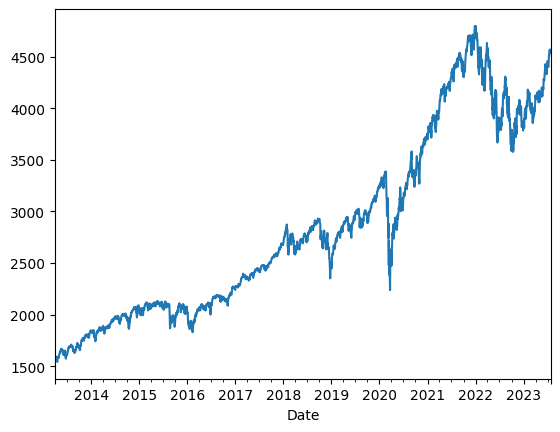

In [13]:
df.plot()
plt.show()

In [14]:
df.index

PeriodIndex(['2023-07-27', '2023-07-26', '2023-07-25', '2023-07-24',
             '2023-07-21', '2023-07-20', '2023-07-19', '2023-07-18',
             '2023-07-17', '2023-07-14',
             ...
             '2013-04-12', '2013-04-11', '2013-04-10', '2013-04-09',
             '2013-04-08', '2013-04-05', '2013-04-04', '2013-04-03',
             '2013-04-02', '2013-04-01'],
            dtype='period[B]', name='Date', length=2600)

In [15]:
idx = pd.period_range(min(df.index), max(df.index))
idx

PeriodIndex(['2013-04-01', '2013-04-02', '2013-04-03', '2013-04-04',
             '2013-04-05', '2013-04-08', '2013-04-09', '2013-04-10',
             '2013-04-11', '2013-04-12',
             ...
             '2023-07-14', '2023-07-17', '2023-07-18', '2023-07-19',
             '2023-07-20', '2023-07-21', '2023-07-24', '2023-07-25',
             '2023-07-26', '2023-07-27'],
            dtype='period[B]', length=2694)

In [16]:
df.index.symmetric_difference(idx)

PeriodIndex(['2013-05-27', '2013-07-04', '2013-09-02', '2013-11-28',
             '2013-12-25', '2014-01-01', '2014-01-20', '2014-02-17',
             '2014-04-18', '2014-05-26', '2014-07-04', '2014-09-01',
             '2014-11-27', '2014-12-25', '2015-01-01', '2015-01-19',
             '2015-02-16', '2015-04-03', '2015-05-25', '2015-07-03',
             '2015-09-07', '2015-11-26', '2015-12-25', '2016-01-01',
             '2016-01-18', '2016-02-15', '2016-03-25', '2016-05-30',
             '2016-07-04', '2016-09-05', '2016-11-24', '2016-12-26',
             '2017-01-02', '2017-01-16', '2017-02-20', '2017-04-14',
             '2017-05-29', '2017-07-04', '2017-09-04', '2017-11-23',
             '2017-12-25', '2018-01-01', '2018-01-15', '2018-02-19',
             '2018-03-30', '2018-05-28', '2018-07-04', '2018-09-03',
             '2018-11-22', '2018-12-05', '2018-12-25', '2019-01-01',
             '2019-01-21', '2019-02-18', '2019-04-19', '2019-05-27',
             '2019-07-04', '2019-0

In [17]:
df = df.reindex(idx, fill_value=np.nan)
df.tail()

2023-07-21    4536.34
2023-07-24    4554.64
2023-07-25    4567.46
2023-07-26    4566.75
2023-07-27    4537.41
Freq: B, Name: Close, dtype: float64

In [18]:
df = df.fillna(method = 'ffill')
df.tail(10)

2023-07-14    4505.42
2023-07-17    4522.79
2023-07-18    4554.98
2023-07-19    4565.72
2023-07-20    4534.87
2023-07-21    4536.34
2023-07-24    4554.64
2023-07-25    4567.46
2023-07-26    4566.75
2023-07-27    4537.41
Freq: B, Name: Close, dtype: float64

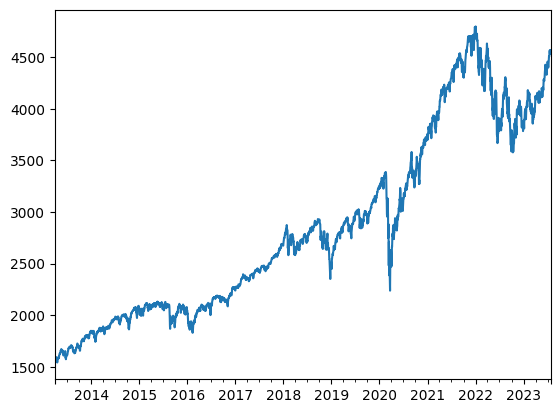

In [19]:
df.plot()
plt.show()

In [20]:
!pip install --upgrade python
!pip install --upgrade pip


ERROR: Could not find a version that satisfies the requirement python (from versions: none)
ERROR: No matching distribution found for python


# Time series Cross validation with PyCaret

In [21]:
from pycaret.time_series import *

if you get the following error "cannot import name 'LegacyVersion' from 'packaging.version'", you should go ahead and downgrade the version of your packaging package!

In [22]:
# !pip install packaging==21.3

In [23]:
from sktime.forecasting.model_selection import SlidingWindowSplitter
# https://www.sktime.net/en/stable/api_reference/auto_generated/sktime.forecasting.model_selection.SlidingWindowSplitter.html

In [24]:
import numpy as np
from sktime.forecasting.model_selection import SlidingWindowSplitter
ts = np.arange(10)
splitter = SlidingWindowSplitter(fh=np.arange(1,3), window_length=3, step_length=1)
list(splitter.split(ts))

[(array([0, 1, 2]), array([3, 4])),
 (array([1, 2, 3]), array([4, 5])),
 (array([2, 3, 4]), array([5, 6])),
 (array([3, 4, 5]), array([6, 7])),
 (array([4, 5, 6]), array([7, 8])),
 (array([5, 6, 7]), array([8, 9]))]

In [25]:
df.size

2694

In [26]:
exp = TSForecastingExperiment()
exp.setup(data = df, target='Close' ,coverage=0.90, fold_strategy=SlidingWindowSplitter(fh=np.arange(1,23), window_length=130, step_length=130)) # using the past 6 months data to make prediction for the next month and moving half a year forward.

,Description,Value
0,session_id,8646
1,Target,Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(2694, 1)"
5,Transformed data shape,"(2694, 1)"
6,Transformed train set shape,"(2672, 1)"
7,Transformed test set shape,"(22, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,SlidingWindowSplitter


---
---
___

Side note:

I am not sure why, but PyCaret timeseries setup does not support sklearn cross validation strategies like "TimeSeriesSplit". This is available with the PyCaret regression and classification though!!!

I was expecting the following code running in Pycaret but it doesn't.


In [27]:
from sklearn.model_selection import TimeSeriesSplit
# exp2 = TSForecastingExperiment()
#exp2.setup(data = df, target='AAPL' , coverage=0.90, fold_strategy=TimeSeriesSplit(n_splits=5, max_train_size=250, gap=20, test_size=60))

---
---
---

In [28]:
exp.plot_model(plot='train_test_split')

In [29]:
exp.plot_model(plot='cv')

Let's see which one is the best model?

In [30]:
exp.compare_models(sort='rmse')

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.4643,1.2890,76.8035,86.8278,0.0274,0.0274,-4.7571,0.9750
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.4411,1.2774,75.5856,87.8990,0.0265,0.0263,-3.3454,1.3385
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.4300,1.2499,77.9712,87.9921,0.0281,0.0284,-4.0917,1.6790
theta,Theta Forecaster,1.3142,1.1713,77.1255,88.4239,0.0267,0.0272,-2.2429,0.0525
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.4577,1.2742,78.9658,89.1119,0.0280,0.0283,-3.8609,1.1400
croston,Croston,1.2867,1.1633,79.1240,90.5898,0.0261,0.0259,-2.6179,0.0270
auto_arima,Auto ARIMA,1.3420,1.1887,80.9686,92.1417,0.0281,0.0288,-2.4368,4.3600
naive,Naive Forecaster,1.3103,1.1714,80.2600,92.2182,0.0275,0.0281,-2.0837,0.5430
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.4943,1.3025,82.8572,92.6346,0.0293,0.0296,-4.0070,1.4285
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.6241,1.4119,86.6173,97.4815,0.0313,0.0317,-5.6182,1.0920


Processing:   0%|          | 0/121 [00:00<?, ?it/s]

BaseCdsDtForecaster(fe_target_rr=[WindowSummarizer(lag_feature={'lag': [9, 8, 7,
                                                                        6, 5, 4,
                                                                        3, 2,
                                                                        1]},
                                                   n_jobs=1)],
                    regressor=HuberRegressor(), sp=9, window_length=9)

# Bootstrapping with PyCaret?

* curious to see how to bootstrapping is handled with PyCaret?
search for the random forest model (rf_cds_dt) source code in Pycaret Github for example.
* As you may see here (https://github.com/pycaret/pycaret/blob/676cdb963877f98496a57bc77317356a09e10d70/pycaret/containers/models/time_series.py ), the bootstrap is on and off and that's it. No special consideration for moving block bootstrap or circular block or stationary bootstrap.

* You can do it from scratch here: https://arch.readthedocs.io/en/latest/bootstrap/timeseries-bootstraps.html
---

In [31]:
my_models = ['naive','ets', 'arima', 'rf_cds_dt', 'knn_cds_dt', 'xgboost_cds_dt', 'lightgbm_cds_dt', 'catboost_cds_dt' , 'gbr_cds_dt']
exp.compare_models(include=my_models, sort='rmse')

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.4411,1.2774,75.5856,87.8990,0.0265,0.0263,-3.3454,1.2670
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.4300,1.2499,77.9712,87.9921,0.0281,0.0284,-4.0917,1.6310
naive,Naive Forecaster,1.3103,1.1714,80.2600,92.2182,0.0275,0.0281,-2.0837,0.0460
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.6241,1.4119,86.6173,97.4815,0.0313,0.0317,-5.6182,0.8095
catboost_cds_dt,CatBoost Regressor w/ Cond. Deseasonalize & Detrending,1.6337,1.4102,88.1240,99.1988,0.0313,0.0316,-5.0270,3.1200
xgboost_cds_dt,Extreme Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.7206,1.5017,93.8217,106.0250,0.0332,0.0334,-6.0128,1.0645
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.7302,1.4898,99.6841,110.1012,0.0342,0.0341,-6.1861,1.1510
arima,ARIMA,1.5215,1.3162,98.1057,111.6507,0.0338,0.0358,-3.3289,0.2950
ets,ETS,1.6512,1.4007,109.0916,124.5625,0.0384,0.0431,-4.3840,0.1670


Processing:   0%|          | 0/41 [00:00<?, ?it/s]

BaseCdsDtForecaster(fe_target_rr=[WindowSummarizer(lag_feature={'lag': [9, 8, 7,
                                                                        6, 5, 4,
                                                                        3, 2,
                                                                        1]},
                                                   n_jobs=1)],
                    regressor=LGBMRegressor(n_jobs=-1, random_state=8646), sp=9,
                    window_length=9)

Let's tuned these models!

In [32]:
ets = exp.create_model('ets')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,0.8558,0.8599,25.5278,30.8780,0.0148,0.0149,0.2188
1,2014-03-28,0.5859,0.5823,16.5212,21.6698,0.0089,0.0089,-0.2638
2,2014-09-26,2.5214,2.3563,57.6102,69.8556,0.0302,0.0296,-2.3094
3,2015-03-27,0.9369,0.8456,39.1388,43.9642,0.0186,0.0189,-5.7914
4,2015-09-25,2.6987,2.0596,89.4429,101.2844,0.0442,0.0454,-2.4613
5,2016-03-25,0.3172,0.2954,16.4891,18.5456,0.0079,0.0080,0.1550
6,2016-09-23,1.1675,1.0138,31.7362,35.7831,0.0148,0.0147,-7.8123
7,2017-03-24,0.4254,0.3939,11.2259,13.5623,0.0048,0.0048,-0.0182
8,2017-09-22,1.3236,1.1933,29.7143,32.9537,0.0116,0.0117,-1.0982
9,2018-03-23,1.7080,1.3272,84.5434,92.7278,0.0318,0.0324,-6.9586


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [33]:
tuned_ets = exp.tune_model(ets)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,1.0838,1.1278,32.3288,40.4969,0.0186,0.0189,-0.3437
1,2014-03-28,0.5981,0.5397,16.8661,20.0834,0.0091,0.0091,-0.0855
2,2014-09-26,2.0731,2.0430,47.3686,60.5668,0.0249,0.0244,-1.4878
3,2015-03-27,0.7433,0.6745,31.0525,35.0671,0.0148,0.0149,-3.3207
4,2015-09-25,2.2805,1.7264,75.5800,84.8998,0.0374,0.0382,-1.4320
5,2016-03-25,0.7768,0.7274,40.3873,45.6722,0.0194,0.0196,-4.1249
6,2016-09-23,0.7564,0.6801,20.5623,24.0036,0.0096,0.0095,-2.9654
7,2017-03-24,0.4634,0.4350,12.2309,14.9760,0.0052,0.0052,-0.2416
8,2017-09-22,1.8979,1.7246,42.6058,47.6248,0.0167,0.0169,-3.3824
9,2018-03-23,1.3381,1.0482,66.2332,73.2326,0.0249,0.0253,-3.9639


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   49.3s finished


In [34]:
arima = exp.create_model('arima')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,0.9257,0.8510,27.6126,30.5573,0.0161,0.0161,0.2349
1,2014-03-28,0.6955,0.6715,19.6116,24.9866,0.0106,0.0105,-0.6803
2,2014-09-26,2.9908,2.7119,68.3358,80.3970,0.0358,0.0349,-3.3835
3,2015-03-27,0.7016,0.6474,29.3071,33.6569,0.0140,0.0141,-2.9802
4,2015-09-25,2.4809,1.8298,82.2225,89.9815,0.0409,0.0417,-1.7319
5,2016-03-25,0.2760,0.3088,14.3519,19.3910,0.0069,0.0069,0.0762
6,2016-09-23,0.7337,0.6578,19.9447,23.2184,0.0093,0.0093,-2.7102
7,2017-03-24,0.5055,0.5056,13.3410,17.4062,0.0057,0.0057,-0.6772
8,2017-09-22,1.0872,0.9884,24.4064,27.2934,0.0096,0.0096,-0.4393
9,2018-03-23,1.8359,1.5631,90.8771,109.2074,0.0341,0.0349,-10.0387


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [35]:
tuned_arima = exp.tune_model(arima)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,1.4979,1.5715,44.6838,56.4324,0.0257,0.0262,-1.6093
1,2014-03-28,0.8954,0.7610,25.2509,28.3188,0.0135,0.0136,-1.1583
2,2014-09-26,1.8125,1.8427,41.4146,54.6270,0.0218,0.0214,-1.0237
3,2015-03-27,1.0408,0.9366,43.4810,48.6942,0.0207,0.0210,-7.3313
4,2015-09-25,0.7658,0.6186,25.3802,30.4219,0.0128,0.0128,0.6877
5,2016-03-25,0.9994,0.9295,51.9574,58.3617,0.0250,0.0254,-7.3683
6,2016-09-23,0.3350,0.2981,9.1064,10.5224,0.0042,0.0042,0.2380
7,2017-03-24,0.6953,0.6395,18.3492,22.0153,0.0078,0.0078,-1.6830
8,2017-09-22,2.3402,2.1415,52.5341,59.1375,0.0206,0.0208,-5.7572
9,2018-03-23,1.0473,0.8364,51.8414,58.4396,0.0195,0.0197,-2.1610


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  1.4min finished


For machine learning models, we need to create a feature space. How many lags you want to use for predicting future values. This is know as window_length=10. Default value=10.

In [36]:
xgboost = exp.create_model('xgboost_cds_dt')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,0.8568,0.8252,25.5584,29.6318,0.0149,0.0149,0.2806
1,2014-03-28,1.1676,1.0926,32.9273,40.6579,0.0178,0.0176,-3.4489
2,2014-09-26,3.3867,3.1417,77.3823,93.1397,0.0406,0.0394,-4.8831
3,2015-03-27,0.4646,0.4367,19.4077,22.7034,0.0093,0.0093,-0.8111
4,2015-09-25,2.5465,1.9618,84.3964,96.4742,0.0417,0.0428,-2.1404
5,2016-03-25,1.5561,1.3575,80.9003,85.2340,0.0390,0.0399,-16.8487
6,2016-09-23,2.0267,1.6737,55.0935,59.0743,0.0257,0.0253,-23.0176
7,2017-03-24,1.8020,1.4806,47.5595,50.9726,0.0202,0.0201,-13.3830
8,2017-09-22,2.0978,1.8597,47.0941,51.3559,0.0185,0.0187,-4.0959
9,2018-03-23,2.2052,1.7373,109.1569,121.3774,0.0413,0.0403,-12.6361


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [37]:
tuned_xgboost = exp.tune_model(xgboost)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,1.1560,1.1667,34.4825,41.8951,0.0199,0.0201,-0.4381
1,2014-03-28,0.8229,0.7220,23.2051,26.8690,0.0124,0.0125,-0.9430
2,2014-09-26,2.4234,2.3208,55.3728,68.8012,0.0291,0.0284,-2.2102
3,2015-03-27,0.2688,0.2893,11.2274,15.0399,0.0054,0.0054,0.2052
4,2015-09-25,2.6924,2.0374,89.2339,100.1915,0.0441,0.0453,-2.3870
5,2016-03-25,2.1776,1.8448,113.2155,115.8291,0.0546,0.0562,-31.9622
6,2016-09-23,1.8103,1.4704,49.2124,51.8978,0.0229,0.0227,-17.5366
7,2017-03-24,0.6304,0.5704,16.6364,19.6371,0.0071,0.0071,-1.1347
8,2017-09-22,1.3926,1.2489,31.2631,34.4878,0.0122,0.0123,-1.2981
9,2018-03-23,1.2642,0.9814,62.5755,68.5672,0.0238,0.0234,-3.3516


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  3.6min finished


In [38]:
knn = exp.create_model('knn_cds_dt')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,0.6431,0.6157,19.1850,22.1100,0.0111,0.0112,0.5995
1,2014-03-28,1.2379,1.0897,34.9087,40.5487,0.0188,0.0186,-3.4250
2,2014-09-26,3.7225,3.1532,85.0550,93.4798,0.0444,0.0433,-4.9262
3,2015-03-27,0.9290,0.7924,38.8102,41.1978,0.0185,0.0183,-4.9636
4,2015-09-25,1.6586,1.2557,54.9715,61.7510,0.0273,0.0277,-0.2866
5,2016-03-25,1.5536,1.3400,80.7710,84.1340,0.0389,0.0398,-16.3910
6,2016-09-23,1.6864,1.3515,45.8431,47.7027,0.0214,0.0211,-14.6610
7,2017-03-24,1.7505,1.5834,46.1982,54.5134,0.0197,0.0194,-15.4506
8,2017-09-22,1.5619,1.4093,35.0623,38.9177,0.0137,0.0139,-1.9264
9,2018-03-23,2.7999,2.0492,138.5931,143.1732,0.0524,0.0510,-17.9731


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [39]:
tuned_knn = exp.tune_model(knn)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2013-09-27,0.6171,0.6983,18.4086,25.0749,0.0109,0.0108,0.4848
1,2014-03-28,1.1767,1.0453,33.1819,38.8963,0.0179,0.0177,-3.0717
2,2014-09-26,3.7301,3.1684,85.2284,93.9300,0.0445,0.0433,-4.9834
3,2015-03-27,0.4202,0.3847,17.5517,20.0027,0.0084,0.0084,-0.4058
4,2015-09-25,1.7462,1.3130,57.8733,64.5671,0.0288,0.0291,-0.4066
5,2016-03-25,1.5765,1.3510,81.9630,84.8261,0.0395,0.0404,-16.6783
6,2016-09-23,1.2674,1.0196,34.4543,35.9861,0.0161,0.0159,-7.9126
7,2017-03-24,1.6969,1.4239,44.7849,49.0197,0.0191,0.0188,-12.3020
8,2017-09-22,1.4700,1.3097,32.9988,36.1677,0.0129,0.0130,-1.5275
9,2018-03-23,2.8766,2.0783,142.3915,145.2075,0.0539,0.0524,-18.5161


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 20 folds for each of 10 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  3.7min finished


Probably, the tuned_ets is the bets performer here! barely outperforming the random walk model with no drift!!

In [40]:
tuned_ets

AutoETS(error='mul', seasonal='add', sp=9)

In [41]:
exp.plot_model(estimator=tuned_ets, plot="diagnostics")

In [42]:
exp.plot_model(tuned_ets, plot='insample')

In [43]:
exp.plot_model(tuned_ets, plot='forecast', data_kwargs={'fh':36})

---
# Predict Model

This function predicts Label using a trained model. When data is None, it predicts label on the holdout set.



In [44]:
holdout_pred = exp.predict_model(tuned_ets)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ETS,1.8663,1.4124,113.2391,129.1662,0.0251,0.0255,-3.3306


In [45]:
holdout_pred

,y_pred
2023-06-28,4371.6973
2023-06-29,4370.5288
2023-06-30,4370.7596
2023-07-03,4371.5504
2023-07-04,4373.1084
2023-07-05,4371.3366
2023-07-06,4373.0875
2023-07-07,4372.2065
2023-07-10,4372.6220
2023-07-11,4371.6973


# Finalize Model

This function trains a given estimator on the entire dataset including the holdout set.

Model finalization is the last step in the experiment. This workflow will eventually lead you to the best model for use in making predictions on new and unseen data. The finalize_model() function fits the model onto the complete dataset including the test/hold-out sample. The purpose of this function is to train the model on the complete dataset before it is deployed in production.


In [46]:
final_model = exp.finalize_model(tuned_ets)

In [47]:
exp.plot_model(final_model, plot='forecast', data_kwargs={'fh':24})

In [48]:
unseen_predictions = exp.predict_model(final_model, fh=10)
unseen_predictions

,y_pred
2023-07-28,4542.7138
2023-07-31,4540.9691
2023-08-01,4542.6611
2023-08-02,4541.7592
2023-08-03,4542.0851
2023-08-04,4541.1780
2023-08-07,4540.1151
2023-08-08,4540.4029
2023-08-09,4541.1199
2023-08-10,4542.7138


# Done!